<a href="https://colab.research.google.com/github/wang550086/learn_PyGMT01/blob/main/pygmt_0_17_0_googlecolab_setup.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### PyGMT 0.17 no Google Colab

> ⚠️ **Nota:** Há uma incompatibilidade temporária no sistema de resolução do conda/mamba no Colab (a versão do Python em uso é **3.12.11**, mas o solver pode conter um *pin* interno diferente).  
> Por isso, para instalar o PyGMT é necessário usar uma versão compatível do **condacolab** (ou ajustar o arquivo `pinned` do conda para **python=3.12**).  
> Depois disso, o **PyGMT 0.17** instala e executa normalmente. Isso será corrigido em uma atualização futura do Colab.


In [1]:
!pip install condacolab --quiet
# need to install condacolab for a python 3.11 pin
import condacolab
condacolab.install_from_url("https://github.com/conda-forge/miniforge/releases/download/25.3.1-0/Miniforge3-Linux-x86_64.sh")

✨🍰✨ Everything looks OK!


**Don't PANIC !** The kernel will restart automatically.

After that, install `pygmt` normally.

In [7]:
!mamba install pygmt gmt --quiet # <--- it takes around 1 minute, ensuring GMT C library is installed

warning  libmamba [numpy-2.3.4-py312h33ff503_0] The following files were already present in the environment:
    - bin/f2py
    - bin/numpy-config


In [8]:
import pygmt
pygmt.show_versions()

PyGMT information:
  version: v0.17.0
System information:
  python: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
  executable: /usr/bin/python3.real
  machine: Linux-6.6.105+-x86_64-with-glibc2.35
Dependency information:
  numpy: 2.3.4
  pandas: 2.3.3
  xarray: 2025.10.1
  packaging: 25.0
  contextily: None
  geopandas: 1.1.1
  IPython: 7.34.0
  pyarrow: 18.1.0
  rioxarray: None
  gdal: 3.11.5
  ghostscript: 10.06.0
GMT library information:
  version: 6.6.0
  padding: 2
  share dir: /usr/local/share/gmt
  plugin dir: /usr/local/lib/gmt/plugins
  library path: /usr/local/lib/libgmt.so
  cores: 2
  grid layout: rows
  image layout: 
  binary version: 6.6.0


gmtread [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
gmtread [NOTICE]: SRTM15 Earth Relief v2.7 at 1x1 arc degrees reduced by Gaussian Cartesian filtering (314.5 km fullwidth) [Tozer et al., 2019].
gmtread [NOTICE]:   -> Download grid file [111K]: earth_relief_01d_p.grd


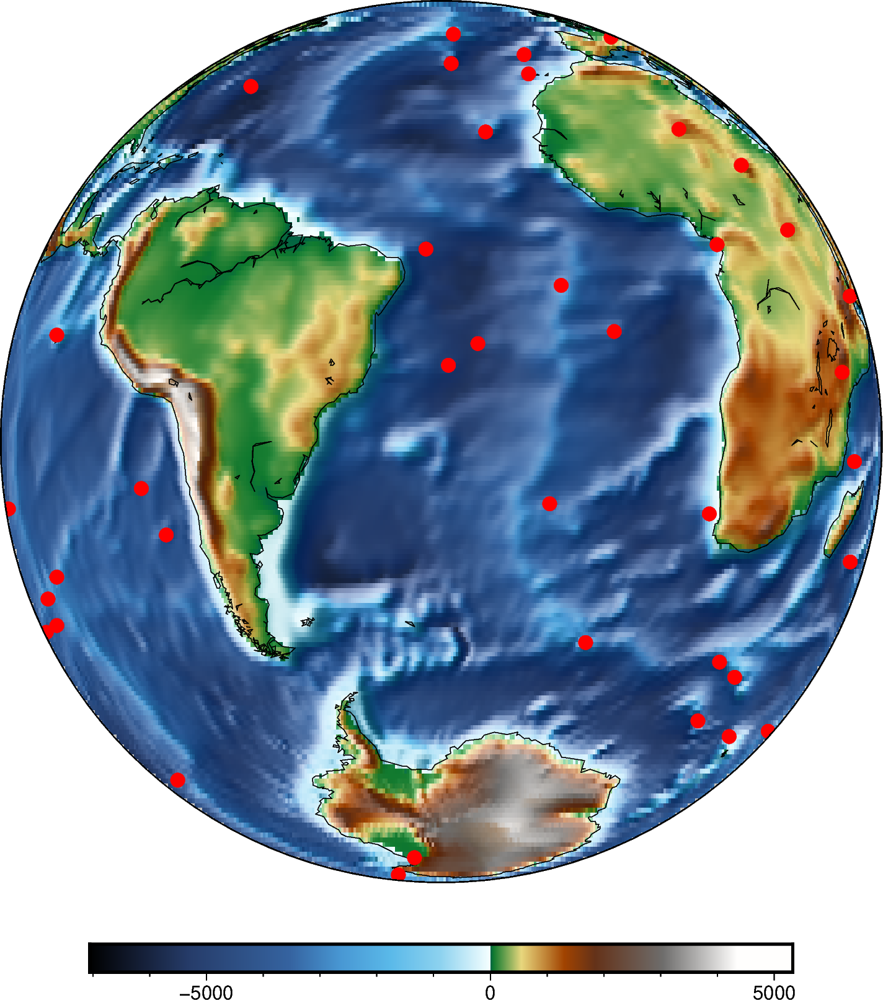

In [9]:
# Just an example
from pygmt.datasets import load_earth_relief #<-- Use global relief for topography

grid = load_earth_relief(resolution='01d', registration='pixel')

fig = pygmt.Figure()
fig.basemap(region='g', projection='G330/-30/12c', frame=True)
fig.grdimage(grid, cmap='geo', shading=True)
fig.coast(resolution='c', shorelines=True, area_thresh=1000)
fig.plot(data='@hotspots.txt', style='c0.2c', fill='red')
fig.colorbar()
fig.show()

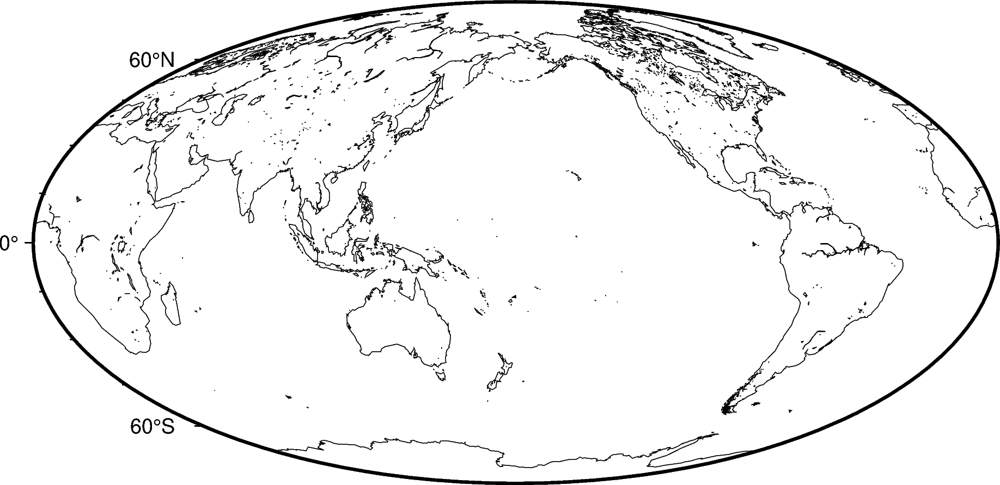

In [10]:
fig = pygmt.Figure()
fig.basemap(region="g", projection="W15c", frame=True)
fig.coast(shorelines=True)
fig.show()

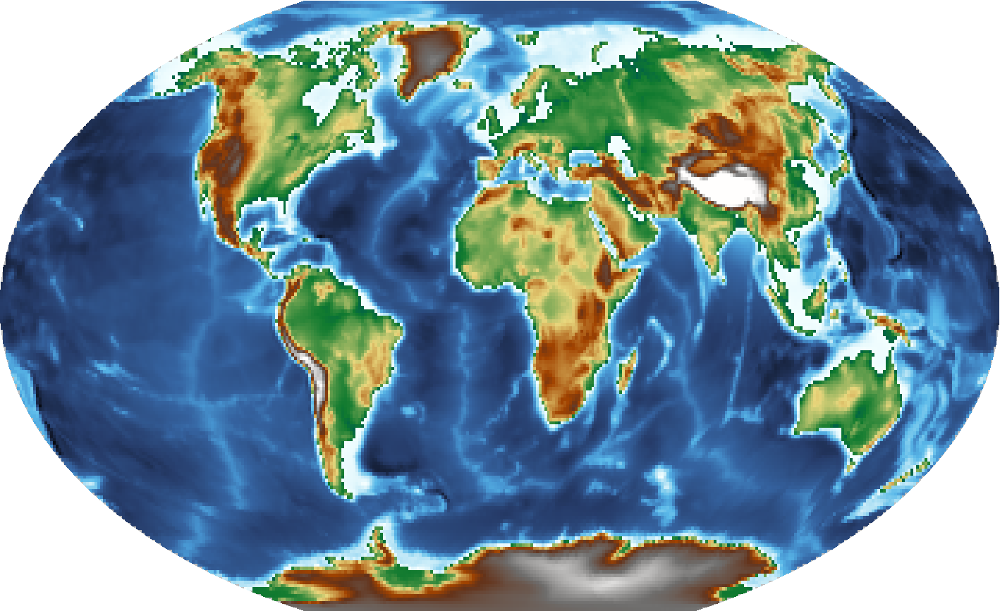

In [11]:
fig = pygmt.Figure()
fig.grdimage(grid=grid, projection="R12c", cmap="geo")
fig.show()

Download complete. Generating map...


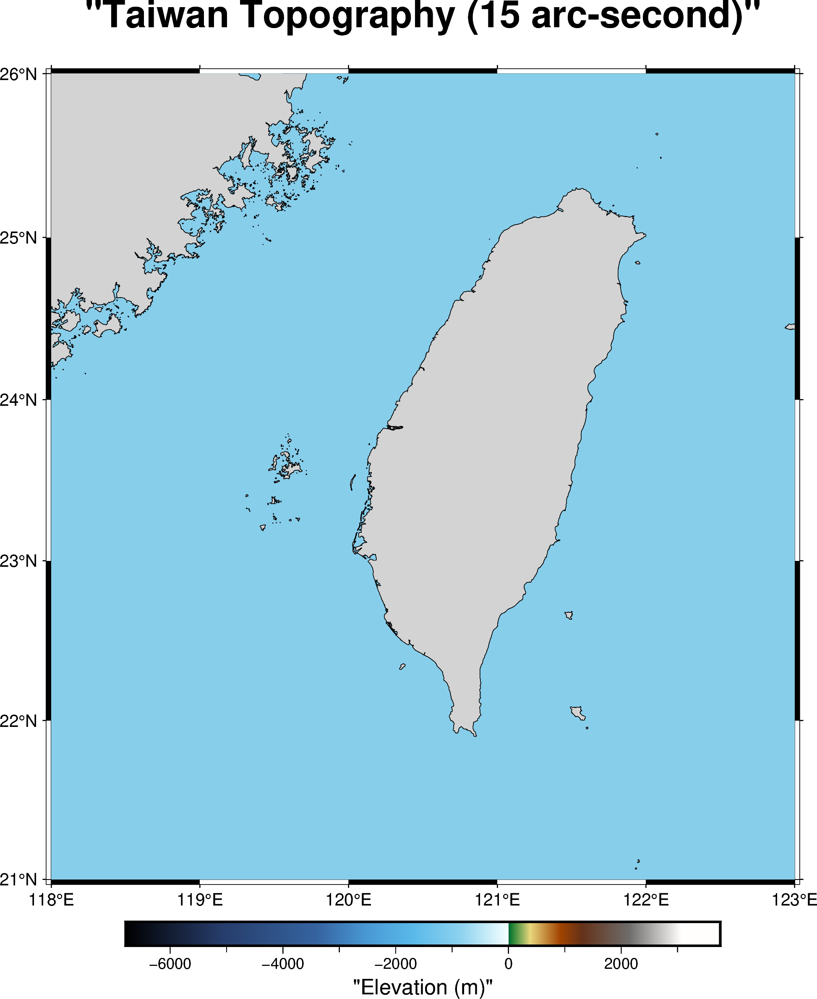

In [14]:
import pygmt

# Define the region for Taiwan more precisely for the high-resolution data load
taiwan_region = [118, 123, 21, 26]  # Longitude and Latitude for Taiwan

# Load a higher resolution earth relief grid specifically for the Taiwan region.
# Using '15s' for 15 arc-seconds resolution, which requires the 'region' parameter.
# This might take a moment to download the data.
print("Downloading high-resolution earth relief data for Taiwan...")
taiwan_grid = pygmt.datasets.load_earth_relief(
    resolution="15s",
    region=taiwan_region, # Pass the region to load_earth_relief
    # It's good practice to specify data_source for high-res data if needed, e.g., 'igpp'
    # For '15s', 'igpp' is often the source for SRTM15+.
    # pygmt will usually pick the correct source, but explicit can avoid issues.
)
print("Download complete. Generating map...")

fig = pygmt.Figure()

# Use Mercator projection (M) with a width of 15cm for a good view of Taiwan
fig.basemap(
    region=taiwan_region, # Use the same region for basemap
    projection="M15c",
    frame=["a", "+t\"Taiwan Topography (15 arc-second)\""] # Add a title to the map
)

# Plot the terrain for Taiwan using the higher-resolution grid
# Apply the 'geo' colormap and shading for a pronounced topographical effect
fig.grdimage(grid=taiwan_grid, cmap='geo', shading=True)

# Add coastlines, borders, and water/land colors for context
fig.coast(shorelines=True, borders="1/thinnest,black", water="skyblue", land="lightgray")

# Add a color bar to indicate elevation
fig.colorbar(frame=["a", "+L\"Elevation (m)\""])

fig.show()

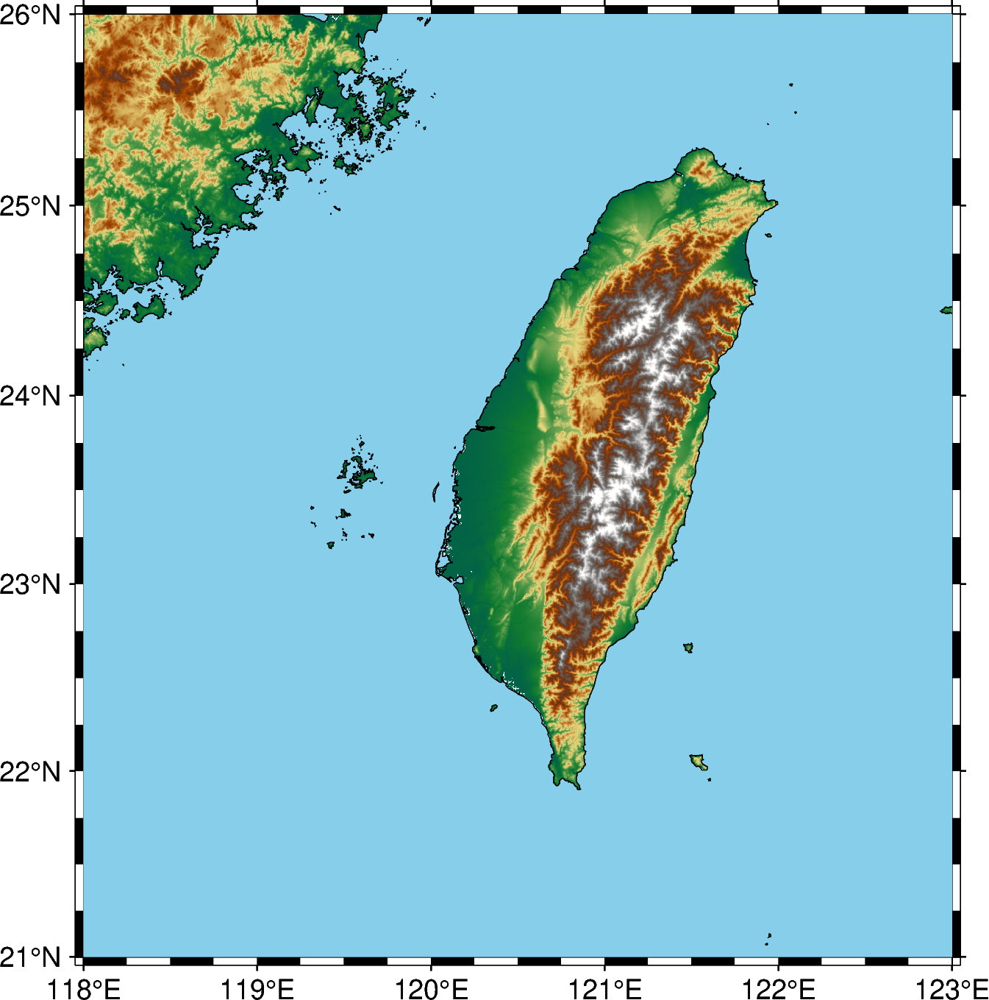

In [15]:
import pygmt

# 建立圖形
fig = pygmt.Figure()

# 台灣地區經緯度範圍
region = [118, 123, 21, 26]

# 載入高解析度地形資料 (15秒解析度)
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=region)

# 繪出台灣地形圖
fig.grdimage(grid=grid, projection="M10c", cmap="geo", frame=True)

# 加上海岸線與國界
fig.coast(shorelines="0.25p,black", borders=[1], water="skyblue")

# 顯示結果
fig.show()


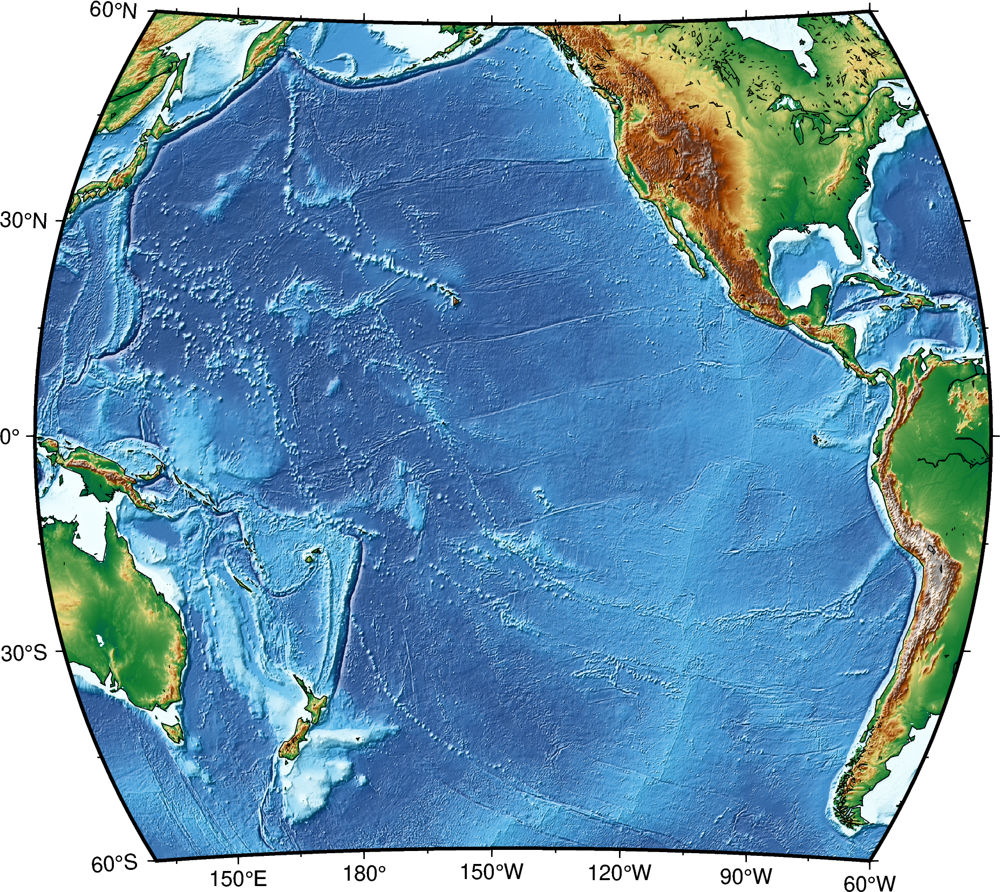

In [17]:
import pygmt
import numpy as np

fig = pygmt.Figure()

# 太平洋範圍
region = [130, 300, -60, 60]

# 載入地形格網（包含海陸）
grid = pygmt.datasets.load_earth_relief(resolution="05m", region=region)

# 畫整體地形（海洋 + 陸地）
fig.grdimage(
    grid=grid,
    projection="R15c",
    cmap="geo",     # 可用 "geo"、"dem2"、"relief"、"globe" 等色表
    shading=True    # 加陰影更立體
)

# 畫海岸線
fig.coast(
    shorelines="0.25p,black",  # 黑色陸地輪廓線
)

# 座標格線
fig.basemap(frame=["a30f15", "WSen"])

# 顯示結果
fig.show()


Saved map to pacific_eq_map.png


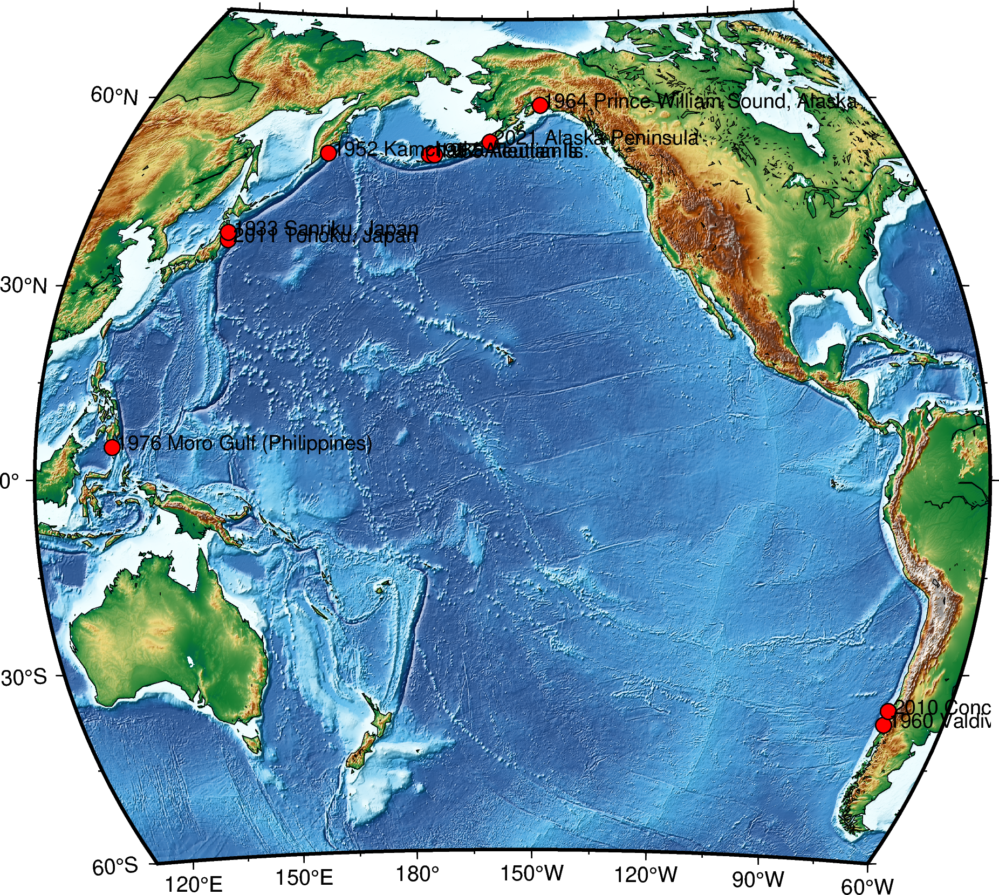

In [24]:
# PyGMT map with red dots for major Pacific-related earthquakes (Sumatra event removed)
# Run this in an environment where pygmt is installed (Colab or local).
import pygmt
import numpy as np

# Map region (Pacific-wide)
region = [110, 300, -60, 75]  # 130E to 300E (i.e., 60W), lat -60..60

# load relief (first time may download data)
grid = pygmt.datasets.load_earth_relief(resolution="05m", region=region)

# Earthquake list (approx epicenters) — same as provided above
events = [
    {"label":"1960 Valdivia, Chile", "lat":-38.29, "lon":-73.05},
    {"label":"2010 Concepción, Chile", "lat":-36.122, "lon":-73.021},
    {"label":"2011 Tohoku, Japan", "lat":38.322, "lon":142.369},
    {"label":"1933 Sanriku, Japan", "lat":39.5, "lon":142.0},
    {"label":"1952 Kamchatka", "lat":52.76, "lon":160.06},
    {"label":"1957 Aleutian Is.", "lat":52.9, "lon":-175.3},
    {"label":"1965 Aleutian Is.", "lat":52.9, "lon":-174.0},
    {"label":"1964 Prince William Sound, Alaska", "lat":61.02, "lon":-147.65},
    {"label":"1976 Moro Gulf (Philippines)", "lat":5.15, "lon":125.28},
    {"label":"2021 Alaska Peninsula", "lat":55.04, "lon":-160.57},
]

# convert lon to 0-360 format expected in region [130,300]
lons = []
lats = []
labels = []
for ev in events:
    lon = ev["lon"]
    lon360 = lon if lon >= 0 else lon + 360
    lons.append(lon360)
    lats.append(ev["lat"])
    labels.append(ev["label"])

fig = pygmt.Figure()

# Draw shaded relief (shows land and seafloor)
fig.grdimage(grid=grid, projection="R15c", cmap="geo", shading=True)

# coastlines (no land fill so relief colors show)
fig.coast(shorelines="0.25p,black")

# plot epicenters as red circles with black outline
fig.plot(x=lons, y=lats, style="c0.25c", fill="red", pen="0.5p,black")

# add short text labels (offset to avoid overlap)
for x, y, lab in zip(lons, lats, labels):
    fig.text(x=x + 0.8, y=y + 0.8, text=lab, font="9p,Helvetica,black", justify="LM")

fig.basemap(frame=["a30f15", "WSen"])

# save figure (path depends on environment)
outpath = "pacific_eq_map.png"
fig.savefig(outpath)
print(f"Saved map to {outpath}")
fig.show()
